<a href="https://colab.research.google.com/github/andrewsundberg/DS301/blob/master/cbb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import math

In [ ]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn import tree
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

In [ ]:
cbb = pd.read_csv("https://raw.githubusercontent.com/andrewsundberg/cbb/master/cbb.csv")

In [ ]:
cbb20 = pd.read_csv("https://raw.githubusercontent.com/andrewsundberg/cbb/master/cbb20.csv")

In [ ]:
cbb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1757 entries, 0 to 1756
Data columns (total 24 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   TEAM        1757 non-null   object 
 1   CONF        1757 non-null   object 
 2   G           1757 non-null   int64  
 3   W           1757 non-null   int64  
 4   ADJOE       1757 non-null   float64
 5   ADJDE       1757 non-null   float64
 6   BARTHAG     1757 non-null   float64
 7   EFG_O       1757 non-null   float64
 8   EFG_D       1757 non-null   float64
 9   TOR         1757 non-null   float64
 10  TORD        1757 non-null   float64
 11  ORB         1757 non-null   float64
 12  DRB         1757 non-null   float64
 13  FTR         1757 non-null   float64
 14  FTRD        1757 non-null   float64
 15  2P_O        1757 non-null   float64
 16  2P_D        1757 non-null   float64
 17  3P_O        1757 non-null   float64
 18  3P_D        1757 non-null   float64
 19  ADJ_T       1757 non-null  

In [ ]:
cbb_num = cbb.select_dtypes(include=['float64'])
cbb_num.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1757 entries, 0 to 1756
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   ADJOE    1757 non-null   float64
 1   ADJDE    1757 non-null   float64
 2   BARTHAG  1757 non-null   float64
 3   EFG_O    1757 non-null   float64
 4   EFG_D    1757 non-null   float64
 5   TOR      1757 non-null   float64
 6   TORD     1757 non-null   float64
 7   ORB      1757 non-null   float64
 8   DRB      1757 non-null   float64
 9   FTR      1757 non-null   float64
 10  FTRD     1757 non-null   float64
 11  2P_O     1757 non-null   float64
 12  2P_D     1757 non-null   float64
 13  3P_O     1757 non-null   float64
 14  3P_D     1757 non-null   float64
 15  ADJ_T    1757 non-null   float64
 16  WAB      1757 non-null   float64
 17  SEED     340 non-null    float64
dtypes: float64(18)
memory usage: 247.2 KB


In [ ]:
#Looking at correlation matrix with numerical columns
corr = cbb_num.corr()
corr.style.background_gradient(cmap='coolwarm')

,ADJOE,ADJDE,BARTHAG,EFG_O,EFG_D,TOR,TORD,ORB,DRB,FTR,FTRD,2P_O,2P_D,3P_O,3P_D,ADJ_T,WAB,SEED
ADJOE,1.000000,-0.528576,0.870686,0.732683,-0.333693,-0.601024,-0.116231,0.261351,-0.266665,0.063637,-0.382290,0.646011,-0.328822,0.579193,-0.198275,0.070476,0.851663,-0.791692
ADJDE,-0.528576,1.000000,-0.852432,-0.221381,0.792320,0.219779,-0.234615,-0.294066,0.347646,-0.125265,0.180823,-0.251354,0.728488,-0.102715,0.564135,0.227852,-0.809486,0.706046
BARTHAG,0.870686,-0.852432,1.000000,0.543153,-0.627696,-0.472329,0.054377,0.310917,-0.337804,0.112072,-0.327932,0.512045,-0.588121,0.386597,-0.427750,-0.079611,0.941776,-0.832709
EFG_O,0.732683,-0.221381,0.543153,1.000000,-0.120335,-0.367975,-0.144287,-0.147990,-0.319901,-0.083514,-0.404445,0.893530,-0.104079,0.763028,-0.100545,0.120142,0.562904,-0.275137
EFG_D,-0.333693,0.792320,-0.627696,-0.120335,1.000000,0.101070,-0.020831,-0.341636,0.172261,-0.205807,0.107161,-0.148439,0.907933,-0.043770,0.722404,0.273412,-0.629864,0.386928
TOR,-0.601024,0.219779,-0.472329,-0.367975,0.101070,1.000000,0.103437,0.134433,0.188585,0.161369,0.316898,-0.288945,0.091686,-0.333397,0.066363,-0.102687,-0.470286,0.291587
TORD,-0.116231,-0.234615,0.054377,-0.144287,-0.020831,0.103437,1.000000,0.118496,0.289078,0.111844,0.392412,-0.079076,0.027203,-0.177276,-0.106798,-0.065216,0.094765,0.057411
ORB,0.261351,-0.294066,0.310917,-0.147990,-0.341636,0.134433,0.118496,1.000000,0.018964,0.280598,0.136233,-0.091259,-0.341291,-0.143735,-0.197189,-0.105308,0.332275,-0.314659
DRB,-0.266665,0.347646,-0.337804,-0.319901,0.172261,0.188585,0.289078,0.018964,1.000000,0.082964,0.235665,-0.299565,0.183057,-0.225528,0.090050,0.032497,-0.303666,0.114416
FTR,0.063637,-0.125265,0.112072,-0.083514,-0.205807,0.161369,0.111844,0.280598,0.082964,1.000000,0.203173,-0.040561,-0.202888,-0.093085,-0.108273,0.039090,0.146079,0.091152


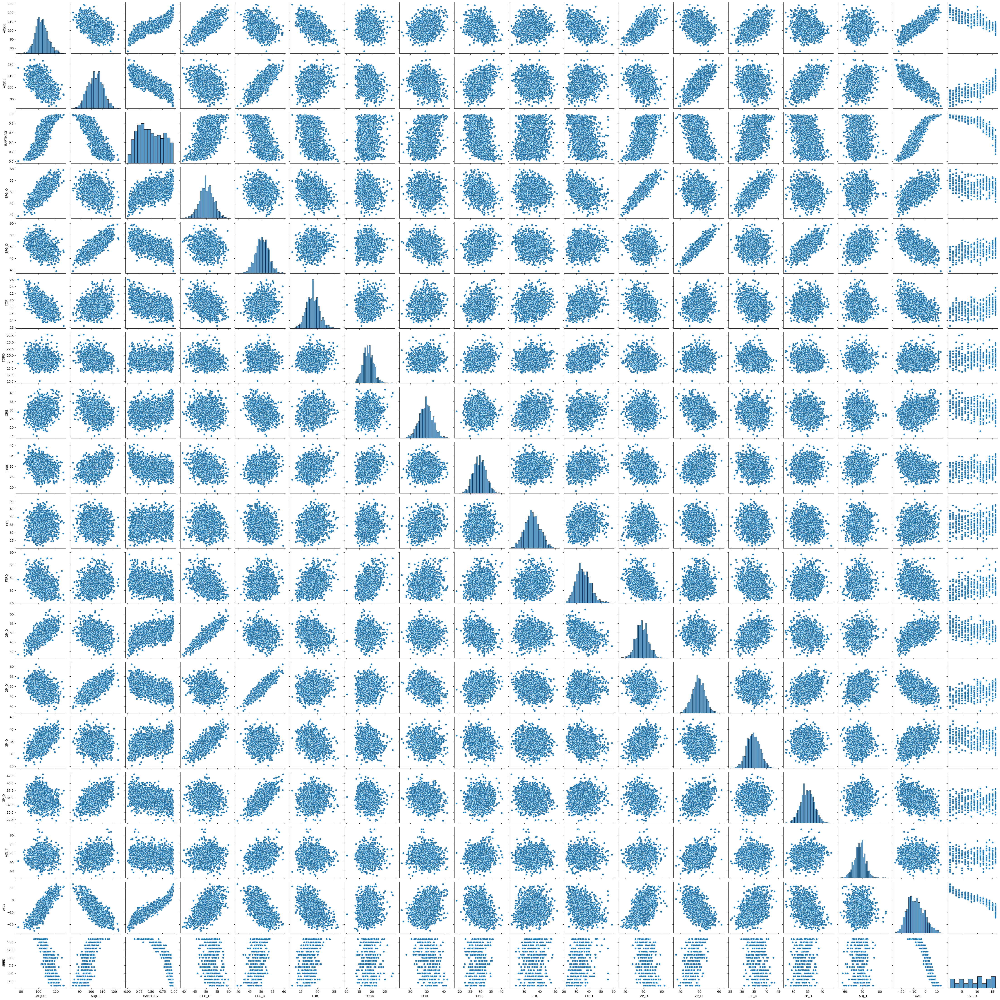

In [ ]:
sns.pairplot(cbb_num)

In [ ]:
cbb['adjde_log'] = np.log(cbb['ADJDE'])
cbb['barthag_log'] = np.log(cbb['BARTHAG'])

In [ ]:
cbb.count

<bound method DataFrame.count of                 TEAM CONF   G   W  ADJOE  ADJDE  BARTHAG  EFG_O  EFG_D   TOR  \
0     North Carolina  ACC  40  33  123.3   94.9   0.9531   52.6   48.1  15.4   
1          Wisconsin  B10  40  36  129.1   93.6   0.9758   54.8   47.7  12.4   
2           Michigan  B10  40  33  114.4   90.4   0.9375   53.9   47.7  14.0   
3         Texas Tech  B12  38  31  115.2   85.2   0.9696   53.5   43.0  17.7   
4            Gonzaga  WCC  39  37  117.8   86.3   0.9728   56.6   41.1  16.2   
...              ...  ...  ..  ..    ...    ...      ...    ...    ...   ...   
1752       Texas A&M  SEC  35  22  111.2   94.7   0.8640   51.4   46.9  19.2   
1753             LSU  SEC  35  28  117.9   96.6   0.9081   51.2   49.9  17.9   
1754       Tennessee  SEC  36  31  122.8   95.2   0.9488   55.3   48.1  15.8   
1755         Gonzaga  WCC  35  27  117.4   94.5   0.9238   55.2   44.8  17.1   
1756         Gonzaga  WCC  37  32  117.2   94.9   0.9192   57.0   47.1  16.1   

      

ValueError: ignored

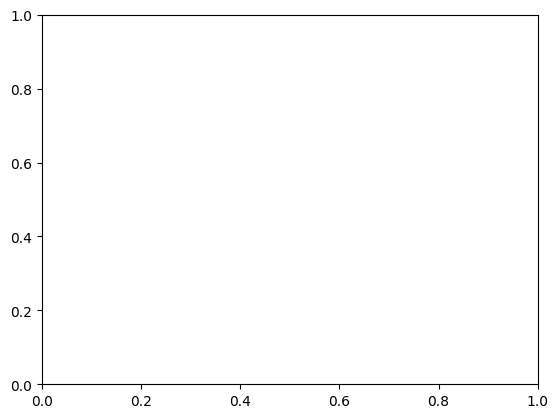

In [ ]:
plt.scatter(x="SEED", y= cbb['adjde_log'], data= cbb)
plt.scatter(x="SEED", y= cbb['barthag_log'], data= cbb)

<Axes: xlabel='ADJDE', ylabel='ADJOE'>

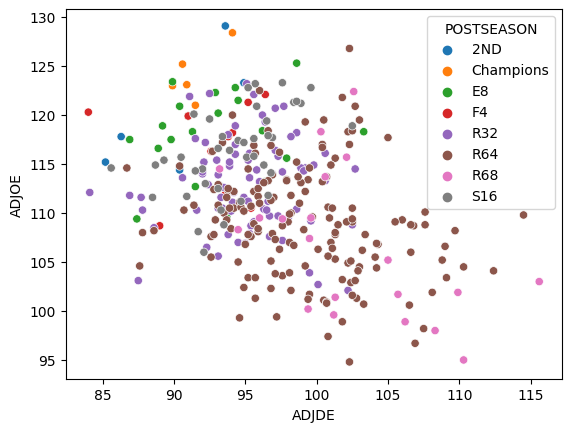

In [ ]:
sns.scatterplot(x="ADJDE", y="ADJOE", data=cbb, hue='POSTSEASON')

In [ ]:
cbb1 = cbb

In [ ]:
cbb1['FF']= ""
for i in range(0,1757):
  if cbb1['POSTSEASON'][i] == 'Champions' or cbb1['POSTSEASON'][i] == '2ND' or cbb1['POSTSEASON'][i] == 'F4':
    cbb1['FF'][i] = 1
  else:
    cbb1['FF'][i] = 0

In [ ]:
cbb1['CHAMP']= ""
for i in range(0,1757):
  if cbb1['POSTSEASON'][i] == 'Champions':
    cbb1['CHAMP'][i] = 1
  else:
    cbb1['CHAMP'][i] = 0

In [ ]:
cbb2 = cbb1.drop(columns=["POSTSEASON"])

In [ ]:
mm = cbb2.dropna()
mm['CHAMP']=mm['CHAMP'].astype('int')

In [ ]:
cat_columns = ["TEAM","CONF"]

In [ ]:
mm1 = pd.get_dummies(mm, prefix_sep="__",columns=cat_columns)
mm1.head()

,G,W,ADJOE,ADJDE,BARTHAG,EFG_O,EFG_D,TOR,TORD,ORB,...,CONF__P12,CONF__Pat,CONF__SB,CONF__SC,CONF__SEC,CONF__SWAC,CONF__Slnd,CONF__Sum,CONF__WAC,CONF__WCC
0,40,33,123.3,94.9,0.9531,52.6,48.1,15.4,18.2,40.7,...,0,0,0,0,0,0,0,0,0,0
1,40,36,129.1,93.6,0.9758,54.8,47.7,12.4,15.8,32.1,...,0,0,0,0,0,0,0,0,0,0
2,40,33,114.4,90.4,0.9375,53.9,47.7,14.0,19.5,25.5,...,0,0,0,0,0,0,0,0,0,0
3,38,31,115.2,85.2,0.9696,53.5,43.0,17.7,22.8,27.4,...,0,0,0,0,0,0,0,0,0,0
4,39,37,117.8,86.3,0.9728,56.6,41.1,16.2,17.1,30.0,...,0,0,0,0,0,0,0,0,0,1


In [ ]:
#Slice Data
X = mm1.loc[:, mm1.columns != 'CHAMP']
y = mm1['CHAMP']
print("X.shape=",X.shape)
print("y.shape=",y.shape)

X.shape= (340, 220)
y.shape= (340,)


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 100)

In [ ]:
X_train

,G,W,ADJOE,ADJDE,BARTHAG,EFG_O,EFG_D,TOR,TORD,ORB,...,CONF__P12,CONF__Pat,CONF__SB,CONF__SC,CONF__SEC,CONF__SWAC,CONF__Slnd,CONF__Sum,CONF__WAC,CONF__WCC
1476,34,22,114.0,92.0,0.9211,48.1,45.6,17.1,18.9,35.6,...,0,0,0,0,0,0,0,0,0,0
1625,28,20,102.4,94.9,0.7057,47.1,46.6,18.4,20.1,32.4,...,0,0,0,0,0,0,0,0,0,0
1566,31,26,107.8,103.4,0.6169,53.9,49.3,17.9,17.4,33.8,...,0,0,0,0,0,0,0,0,0,0
1644,34,28,111.3,96.8,0.8329,53.9,46.5,18.2,17.3,32.0,...,0,0,0,0,0,0,0,0,0,0
1556,31,24,104.6,99.2,0.6480,52.2,47.6,17.3,18.4,34.8,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1470,34,23,106.5,92.3,0.8380,49.5,44.1,21.0,19.9,37.3,...,0,0,0,0,0,0,0,0,0,0
1496,33,22,118.2,98.6,0.8899,52.6,49.7,14.5,18.6,32.2,...,0,0,0,0,0,0,0,0,0,0
1740,37,26,120.9,95.8,0.9353,50.4,49.9,16.5,23.3,37.0,...,0,0,0,0,0,0,0,0,0,0
1697,33,19,122.4,102.6,0.8831,54.1,52.7,16.4,16.2,30.7,...,0,0,0,0,0,0,0,0,0,0


# Decision Tree

In [ ]:
clf = DecisionTreeClassifier(max_depth = 3, min_samples_split=50, random_state=100)
clf = clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

In [ ]:
accuracy_score(y_test, y_pred)

0.9803921568627451

In [ ]:
y_pred == 1
y_test == 1

1660    False
1571    False
1712    False
1463    False
7        True
        ...  
1681    False
19      False
1735    False
1458    False
1581    False
Name: CHAMP, Length: 102, dtype: bool

In [ ]:
r64 = pd.read_csv('https://raw.githubusercontent.com/andrewsundberg/cbb/master/RoundOf64.csv')

In [ ]:
cat_columns = ["TEAM","CONF"]

In [ ]:
r64_2 = pd.get_dummies(r64, prefix_sep="__",columns=cat_columns)
r64_2.head()

,G,W,ADJOE,ADJDE,BARTHAG,EFG_O,EFG_D,TOR,TORD,ORB,...,CONF__P12,CONF__Pat,CONF__SB,CONF__SC,CONF__SEC,CONF__SWAC,CONF__Slnd,CONF__Sum,CONF__WAC,CONF__WCC
0,37,33,123.4,89.9,0.9744,59.0,44.2,14.9,19.0,31.5,...,0,0,0,0,0,0,0,0,0,1
1,38,35,123.0,89.9,0.9736,55.2,44.7,14.7,17.5,30.4,...,0,0,0,0,0,0,0,0,0,0
2,38,32,118.9,89.2,0.9646,53.6,45.0,17.5,19.4,35.6,...,0,0,0,0,0,0,0,0,0,0
3,36,29,120.1,91.4,0.9582,52.9,48.9,17.2,18.3,35.3,...,0,0,0,0,0,0,0,0,0,0
4,37,30,114.6,85.6,0.9665,51.6,44.1,13.9,18.0,24.7,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
#Slice Data
X = r64_2.loc[:, r64_2.columns != 'WON']
y = r64_2['WON']
print("X.shape=",X.shape)
print("y.shape=",y.shape)

X.shape= (448, 235)
y.shape= (448,)


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 100)

In [ ]:
clf = DecisionTreeClassifier(max_depth = 3, min_samples_split=50, random_state=100)
clf = clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

In [ ]:
accuracy_score(y_test, y_pred)

0.8

##Naive Bayes

In [ ]:
#Import Gaussian Naive Bayes model
from sklearn.naive_bayes import GaussianNB

#Create a Gaussian Classifier
model = GaussianNB()

# Train the model using the training sets
model = model.fit(X_train, y_train)

y_pred1 = model.predict(X_test)

In [ ]:
accuracy_score(y_test, y_pred1)

0.6074074074074074

## KNN

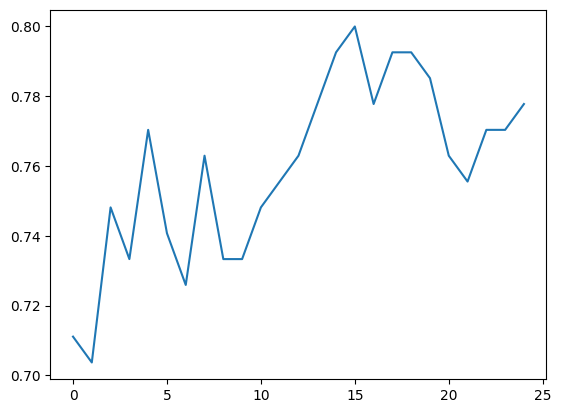

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
# try K=1 through K=25 and record testing accuracy
k_range = range(1, 26)

# We can create Python dictionary using [] or dict()
scores = []

# We use a loop through the range 1 to 26
# We append the scores in the dictionary
for k in k_range:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    y_pred = knn.predict(X_test)
    scores.append(accuracy_score(y_test, y_pred))

plt.plot(scores)

In [ ]:
knn = KNeighborsClassifier(n_neighbors=15)
knn = knn.fit(X_train, y_train)
y_pred2 = knn.predict(X_test)

In [ ]:
accuracy_score(y_test, y_pred2)

0.7925925925925926

## Logistic Regression

In [ ]:
# import the class
from sklearn.linear_model import LogisticRegression

# instantiate the model (using the default parameters)
logreg = LogisticRegression(solver='lbfgs')

# fit the model with data
logreg.fit(X_train, y_train)

# store the predicted response values
y_pred3 = logreg.predict(X_test)

In [ ]:
accuracy_score(y_test, y_pred3)

0.837037037037037

## SVM

In [ ]:
from sklearn.svm import LinearSVC
from sklearn.svm import SVC
svm = SVC()
svm.fit(X_train, y_train)

y_pred4 = svm.predict(X_test)

In [ ]:
accuracy_score(y_test, y_pred4)

0.4888888888888889

## Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=1000, max_leaf_nodes=16, n_jobs=-1)
rf = rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_test)

In [ ]:
accuracy_score(y_pred_rf, y_test)

0.8148148148148148

## Ada Boost

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeRegressor

ada_reg = AdaBoostClassifier(DecisionTreeClassifier(max_depth=5), n_estimators=200, learning_rate=0.5)
ada_reg.fit(X_train, y_train)
y_pred_ada=ada_reg.predict(X_test)

In [ ]:
accuracy_score(y_pred_ada, y_test)

0.7703703703703704

## XGBoost

In [ ]:
from xgboost import XGBClassifier
xgb_reg = XGBClassifier()
xgb_reg.fit(X_train, y_train)
y_pred_xgb = xgb_reg.predict(X_test)

In [ ]:
accuracy_score(y_pred_xgb, y_test)

0.8

## **Feature Engineering**

Standardize Variables

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

## Decision Trees

In [ ]:
clf_scaled = Pipeline([
    ("scaler", StandardScaler()),
    ("tree", DecisionTreeClassifier()),
    ])

clf_scaled = clf_scaled.fit(X_train, y_train)

y_pred5 = clf_scaled.predict(X_test)

In [ ]:
accuracy_score(y_test, y_pred5)

0.7481481481481481

## Naive Bayes

In [ ]:
#Create a Gaussian Classifier
model_scaled = Pipeline([
    ("scaler", StandardScaler()),
    ("bayes", GaussianNB()),
    ])

# Train the model using the training sets
model_scaled = model_scaled.fit(X_train, y_train)
y_pred6 = model_scaled.predict(X_test)

In [ ]:
accuracy_score(y_test, y_pred6)

0.6074074074074074

## KNN

In [ ]:
knn_scaled = Pipeline([
    ("scaler", StandardScaler()),
    ("KNN", KNeighborsClassifier(n_neighbors=17)),
    ])

knn_scaled = knn_scaled.fit(X_train, y_train)
y_pred7 = knn_scaled.predict(X_test)

In [ ]:
accuracy_score(y_test, y_pred7)

0.5185185185185185

## Logistic Regression

In [ ]:
logreg_scaled = Pipeline([
    ("scaler", StandardScaler()),
    ("LogReg", LogisticRegression(solver='lbfgs')),
    ])

# fit the model with data
logreg_scaled.fit(X_train, y_train)

# store the predicted response values
y_pred8 = logreg_scaled.predict(X_test)

In [ ]:
accuracy_score(y_test, y_pred8)

0.7703703703703704

## SVM

In [ ]:
svm_scaled = Pipeline([
    ("scaler", StandardScaler()),
    ("svm", SVC()),
    ])

svm_scaled.fit(X_train, y_train)

y_pred9 = svm_scaled.predict(X_test)

In [ ]:
accuracy_score(y_test, y_pred9)

0.6962962962962963

In [ ]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_classif

# using mutual_info_classif to try to capture any kind of statistical dependency
np.random.seed(1)
xbest=SelectKBest(mutual_info_classif, k="all").fit(X_train, y_train)

# building a dataframe to analyze
scores=pd.DataFrame(xbest.scores_)
columns=pd.DataFrame(X_train.columns)
colscores=pd.concat([columns, scores], axis=1)
colscores.columns = ['col','score']
print(colscores.sort_values(by='score', axis=0, ascending=False))

                         col     score
4                    BARTHAG  0.217972
0                          G  0.198869
18                       WAB  0.190724
2                      ADJOE  0.155460
19                      SEED  0.136616
..                       ...       ...
159        TEAM__Stony Brook  0.000000
158  TEAM__Stephen F. Austin  0.000000
157           TEAM__Stanford  0.000000
156         TEAM__St. John's  0.000000
117         TEAM__New Mexico  0.000000

[235 rows x 2 columns]


In [ ]:
r64_3 = r64.drop(['TEAM','CONF','YEAR'], axis=1)
r64_3

,G,W,ADJOE,ADJDE,BARTHAG,EFG_O,EFG_D,TOR,TORD,ORB,...,FTR,FTRD,2P_O,2P_D,3P_O,3P_D,ADJ_T,WAB,SEED,WON
0,37,33,123.4,89.9,0.9744,59.0,44.2,14.9,19.0,31.5,...,35.3,25.9,61.4,43.4,36.3,30.4,72.0,7.0,1,1
1,38,35,123.0,89.9,0.9736,55.2,44.7,14.7,17.5,30.4,...,29.1,26.3,52.5,45.7,39.5,28.9,60.7,11.1,1,1
2,38,32,118.9,89.2,0.9646,53.6,45.0,17.5,19.4,35.6,...,33.2,24.0,58.0,45.0,30.8,29.9,73.6,11.2,1,1
3,36,29,120.1,91.4,0.9582,52.9,48.9,17.2,18.3,35.3,...,30.2,28.4,52.1,47.9,36.2,33.5,76.0,10.0,1,1
4,37,30,114.6,85.6,0.9665,51.6,44.1,13.9,18.0,24.7,...,27.5,24.1,51.8,44.3,34.2,29.1,65.9,9.2,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
443,35,24,101.2,98.7,0.5722,49.6,48.3,21.2,19.9,31.7,...,40.0,27.8,46.7,47.6,37.0,33.1,63.2,-4.5,15,0
444,35,19,100.1,100.4,0.4895,48.6,47.9,22.2,20.8,34.8,...,37.6,37.8,48.3,47.6,32.7,32.4,66.0,-8.4,16,0
445,36,19,90.6,95.7,0.3459,45.7,45.2,22.7,23.4,29.8,...,42.6,41.1,45.4,43.4,30.7,32.0,66.9,-11.5,16,0
446,30,20,95.9,96.7,0.4750,49.1,41.9,16.8,20.2,26.2,...,40.3,34.9,46.0,40.5,36.7,30.0,65.0,-5.7,16,0


In [ ]:
#Slice Data
X1 = r64_3.loc[:, r64_3.columns != 'WON']
y1 = r64_3['WON']
print("X.shape=",X1.shape)
print("y.shape=",y1.shape)

X.shape= (448, 20)
y.shape= (448,)


In [ ]:
X_train1, X_test1, y_train1, y_test1 = train_test_split(X1, y1, test_size = 0.3, random_state = 100)

##Decision Trees

In [ ]:
clf = DecisionTreeClassifier(max_depth = 3, min_samples_split=50, random_state=100)
clf = clf.fit(X_train1, y_train1)
y_pred = clf.predict(X_test1)

In [ ]:
accuracy_score(y_test1, y_pred)

0.8

##Voting Classifier

In [ ]:
tree_clf = DecisionTreeClassifier()
bayes_clf = GaussianNB()
knn_clf = KNeighborsClassifier()
log_clf = LogisticRegression(solver = 'lbfgs')
svm_clf = SVC()

rnd_clf = RandomForestClassifier()
ada_clf = AdaBoostClassifier()
xgb_clf = XGBClassifier()

In [ ]:
from sklearn.ensemble import VotingClassifier

voting_clf = VotingClassifier(
        estimators=[('tree', tree_clf), ('bayes', bayes_clf), ('knn', knn_clf),('lr', log_clf), ('svm', svm_clf),
                    ('rf', rnd_clf),('ada', ada_clf), ('xgb', xgb_clf) ],
        voting='hard')
voting_clf = voting_clf.fit(X_train, y_train)

In [ ]:
for clf in (tree_clf, bayes_clf, knn_clf, log_clf, svm_clf, rnd_clf, ada_clf, xgb_clf, voting_clf):
  clf.fit(X_train, y_train)
  y_pred = clf.predict(X_test)
  print(clf.__class__.__name__, accuracy_score(y_test, y_pred))

DecisionTreeClassifier 0.762962962962963
GaussianNB 0.6074074074074074
KNeighborsClassifier 0.7703703703703704
LogisticRegression 0.837037037037037
SVC 0.4888888888888889
RandomForestClassifier 0.8222222222222222
AdaBoostClassifier 0.7333333333333333
XGBClassifier 0.8
VotingClassifier 0.7925925925925926


In [ ]:
cbb21 = pd.read_csv('https://raw.githubusercontent.com/andrewsundberg/cbb/master/cbb21.csv')

In [ ]:
cbb21_2 = cbb21.drop(['TEAM','CONF'], axis=1)

##Decision Trees

In [ ]:
clf = DecisionTreeClassifier(max_depth = 3, min_samples_split=50, random_state=100)
clf = clf.fit(X_train1, y_train1)
y_pred = clf.predict(X_test1)

In [ ]:
accuracy_score(y_test1, y_pred)

0.8

In [ ]:
mm21 = cbb21_2.dropna()
mm21

,G,W,ADJOE,ADJDE,BARTHAG,EFG_O,EFG_D,TOR,TORD,ORB,DRB,FTR,FTRD,2P_O,2P_D,3P_O,3P_D,ADJ_T,WAB,SEED
0,24,20,118.1,91.1,0.9521,54.9,44.9,16.3,15.1,29.4,24.8,28.9,24.5,53.3,42.3,38.7,33.5,66.9,7.2,1.0
1,24,22,123.2,94.5,0.9548,57.5,49.1,17.6,24.6,37.5,30.9,27.0,31.7,54.1,48.1,41.8,34.0,68.8,6.6,1.0
2,29,23,117.7,90.4,0.9539,55.6,46.6,18.2,16.1,33.0,22.2,39.2,30.5,55.3,45.4,37.6,32.7,70.7,8.9,1.0
3,26,26,125.4,89.8,0.9791,61.0,47.5,16.1,20.3,30.4,23.4,36.7,25.9,64.0,46.8,36.5,32.5,74.6,8.5,1.0
4,29,21,123.5,95.7,0.9491,54.6,48.3,13.3,16.3,30.7,28.6,32.0,22.6,52.4,45.8,38.6,34.8,70.0,5.6,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63,22,12,95.7,100.6,0.3593,48.7,45.5,20.1,16.3,31.7,24.6,29.7,24.6,47.7,45.6,33.7,30.1,62.2,-7.2,16.0
64,23,15,97.3,99.6,0.4345,50.4,47.6,19.0,20.4,24.8,28.6,28.6,25.0,51.3,50.7,32.7,28.7,66.9,-4.9,16.0
65,21,16,99.4,104.1,0.3698,49.7,47.4,17.8,20.7,28.8,28.7,38.6,42.0,46.1,47.2,37.4,31.7,67.9,-5.0,16.0
66,23,16,97.3,103.5,0.3307,48.3,46.5,21.4,19.2,32.9,25.7,38.9,33.8,51.0,45.2,27.7,32.4,71.8,-4.5,16.0


In [ ]:
clf.predict(mm21)

array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1,
       1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0])

In [ ]:
pred_r64 = cbb21.dropna()

In [ ]:
pred_r64['PRED'] = clf.predict(mm21)

Combining Prediction with 2021 data

In [ ]:
pd.set_option("display.max_rows", None, "display.max_columns", None)
pred_r64

,TEAM,CONF,G,W,ADJOE,ADJDE,BARTHAG,EFG_O,EFG_D,TOR,TORD,ORB,DRB,FTR,FTRD,2P_O,2P_D,3P_O,3P_D,ADJ_T,WAB,SEED,PRED
0,Michigan,B10,24,20,118.1,91.1,0.9521,54.9,44.9,16.3,15.1,29.4,24.8,28.9,24.5,53.3,42.3,38.7,33.5,66.9,7.2,1.0,1
1,Baylor,B12,24,22,123.2,94.5,0.9548,57.5,49.1,17.6,24.6,37.5,30.9,27.0,31.7,54.1,48.1,41.8,34.0,68.8,6.6,1.0,0
2,Illinois,B10,29,23,117.7,90.4,0.9539,55.6,46.6,18.2,16.1,33.0,22.2,39.2,30.5,55.3,45.4,37.6,32.7,70.7,8.9,1.0,1
3,Gonzaga,WCC,26,26,125.4,89.8,0.9791,61.0,47.5,16.1,20.3,30.4,23.4,36.7,25.9,64.0,46.8,36.5,32.5,74.6,8.5,1.0,1
4,Iowa,B10,29,21,123.5,95.7,0.9491,54.6,48.3,13.3,16.3,30.7,28.6,32.0,22.6,52.4,45.8,38.6,34.8,70.0,5.6,2.0,1
5,Ohio St.,B10,30,21,122.1,97.0,0.9340,53.1,48.9,15.3,15.0,29.1,27.4,37.6,33.8,52.1,47.4,36.5,34.1,66.9,6.0,2.0,1
6,Houston,Amer,26,24,120.6,90.9,0.9626,51.3,42.9,16.3,21.6,39.4,28.0,30.7,42.4,49.9,43.0,35.5,28.5,65.0,4.0,2.0,1
7,Alabama,SEC,30,24,111.0,88.1,0.9343,51.3,45.3,18.6,21.1,31.5,29.8,28.6,31.9,50.1,46.4,35.1,28.8,73.9,6.8,2.0,1
8,West Virginia,B12,27,18,115.9,95.3,0.9046,48.7,50.2,17.0,20.7,35.6,31.3,39.4,28.5,46.4,51.3,35.7,32.3,69.6,3.0,3.0,1
9,Texas,B12,26,19,113.8,93.5,0.9058,52.9,46.7,20.2,17.8,31.3,26.9,34.0,36.7,52.4,45.8,35.7,32.3,69.1,4.2,3.0,1


##XGBoost

In [ ]:
from xgboost import XGBClassifier
xgb_reg = XGBClassifier()
xgb_reg.fit(X_train1, y_train1)
y_pred_xgb = xgb_reg.predict(X_test1)

In [ ]:
accuracy_score(y_pred_xgb, y_test1)

0.8148148148148148

In [ ]:
xgb_reg.predict(mm21)

array([0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0])

In [ ]:
pred_r64_xgb = cbb21.dropna()

In [ ]:
pred_r64_xgb['PRED'] = xgb_reg.predict(mm21)

In [ ]:
pd.set_option("display.max_rows", None, "display.max_columns", None)
pred_r64_xgb

,TEAM,CONF,G,W,ADJOE,ADJDE,BARTHAG,EFG_O,EFG_D,TOR,TORD,ORB,DRB,FTR,FTRD,2P_O,2P_D,3P_O,3P_D,ADJ_T,WAB,SEED,PRED
0,Michigan,B10,24,20,118.1,91.1,0.9521,54.9,44.9,16.3,15.1,29.4,24.8,28.9,24.5,53.3,42.3,38.7,33.5,66.9,7.2,1.0,0
1,Baylor,B12,24,22,123.2,94.5,0.9548,57.5,49.1,17.6,24.6,37.5,30.9,27.0,31.7,54.1,48.1,41.8,34.0,68.8,6.6,1.0,0
2,Illinois,B10,29,23,117.7,90.4,0.9539,55.6,46.6,18.2,16.1,33.0,22.2,39.2,30.5,55.3,45.4,37.6,32.7,70.7,8.9,1.0,0
3,Gonzaga,WCC,26,26,125.4,89.8,0.9791,61.0,47.5,16.1,20.3,30.4,23.4,36.7,25.9,64.0,46.8,36.5,32.5,74.6,8.5,1.0,1
4,Iowa,B10,29,21,123.5,95.7,0.9491,54.6,48.3,13.3,16.3,30.7,28.6,32.0,22.6,52.4,45.8,38.6,34.8,70.0,5.6,2.0,0
5,Ohio St.,B10,30,21,122.1,97.0,0.9340,53.1,48.9,15.3,15.0,29.1,27.4,37.6,33.8,52.1,47.4,36.5,34.1,66.9,6.0,2.0,0
6,Houston,Amer,26,24,120.6,90.9,0.9626,51.3,42.9,16.3,21.6,39.4,28.0,30.7,42.4,49.9,43.0,35.5,28.5,65.0,4.0,2.0,1
7,Alabama,SEC,30,24,111.0,88.1,0.9343,51.3,45.3,18.6,21.1,31.5,29.8,28.6,31.9,50.1,46.4,35.1,28.8,73.9,6.8,2.0,1
8,West Virginia,B12,27,18,115.9,95.3,0.9046,48.7,50.2,17.0,20.7,35.6,31.3,39.4,28.5,46.4,51.3,35.7,32.3,69.6,3.0,3.0,0
9,Texas,B12,26,19,113.8,93.5,0.9058,52.9,46.7,20.2,17.8,31.3,26.9,34.0,36.7,52.4,45.8,35.7,32.3,69.1,4.2,3.0,1


## Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=1000, max_leaf_nodes=16, n_jobs=-1)
rf = rf.fit(X_train1, y_train1)
y_pred_rf = rf.predict(X_test1)

In [ ]:
accuracy_score(y_pred_rf, y_test1)

0.8222222222222222

In [ ]:
rf.predict(mm21)

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0,
       1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0])

In [ ]:
pred_r64_rf = cbb21.dropna()

In [ ]:
pred_r64_rf['PRED'] = rf.predict(mm21)

In [ ]:
pd.set_option("display.max_rows", None, "display.max_columns", None)
pred_r64_rf

,TEAM,CONF,G,W,ADJOE,ADJDE,BARTHAG,EFG_O,EFG_D,TOR,TORD,ORB,DRB,FTR,FTRD,2P_O,2P_D,3P_O,3P_D,ADJ_T,WAB,SEED,PRED
0,Michigan,B10,24,20,118.1,91.1,0.9521,54.9,44.9,16.3,15.1,29.4,24.8,28.9,24.5,53.3,42.3,38.7,33.5,66.9,7.2,1.0,1
1,Baylor,B12,24,22,123.2,94.5,0.9548,57.5,49.1,17.6,24.6,37.5,30.9,27.0,31.7,54.1,48.1,41.8,34.0,68.8,6.6,1.0,1
2,Illinois,B10,29,23,117.7,90.4,0.9539,55.6,46.6,18.2,16.1,33.0,22.2,39.2,30.5,55.3,45.4,37.6,32.7,70.7,8.9,1.0,1
3,Gonzaga,WCC,26,26,125.4,89.8,0.9791,61.0,47.5,16.1,20.3,30.4,23.4,36.7,25.9,64.0,46.8,36.5,32.5,74.6,8.5,1.0,1
4,Iowa,B10,29,21,123.5,95.7,0.9491,54.6,48.3,13.3,16.3,30.7,28.6,32.0,22.6,52.4,45.8,38.6,34.8,70.0,5.6,2.0,1
5,Ohio St.,B10,30,21,122.1,97.0,0.9340,53.1,48.9,15.3,15.0,29.1,27.4,37.6,33.8,52.1,47.4,36.5,34.1,66.9,6.0,2.0,1
6,Houston,Amer,26,24,120.6,90.9,0.9626,51.3,42.9,16.3,21.6,39.4,28.0,30.7,42.4,49.9,43.0,35.5,28.5,65.0,4.0,2.0,1
7,Alabama,SEC,30,24,111.0,88.1,0.9343,51.3,45.3,18.6,21.1,31.5,29.8,28.6,31.9,50.1,46.4,35.1,28.8,73.9,6.8,2.0,1
8,West Virginia,B12,27,18,115.9,95.3,0.9046,48.7,50.2,17.0,20.7,35.6,31.3,39.4,28.5,46.4,51.3,35.7,32.3,69.6,3.0,3.0,1
9,Texas,B12,26,19,113.8,93.5,0.9058,52.9,46.7,20.2,17.8,31.3,26.9,34.0,36.7,52.4,45.8,35.7,32.3,69.1,4.2,3.0,1
